In [25]:
# Import required libraries
import os
import pandas as pd
import numpy as np
import random
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline
from skimage.transform import resize
from skimage.io import imread
import tensorflow as tf
import cv2
#from tensorflow.keras.applications.mobilenet import preprocess_input
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn import svm
from sklearn.model_selection import train_test_split


<span style="font-family: Arial; font-weight:bold;font-size:2.5em;color:#00b3e5;"> Milestone 1

<span style="font-family: Arial; font-weight:bold;font-size:2em;color:#00b3e5;"> Step 1: Import the data \
    Step 2: Map training and testing images to its classes

In [26]:
# Hyperparameters for loading the training, testing data and mapping it with annotations
validation_split = 0.2
batch_size = 32
shuffle = False # This is set to false to mainitain the same order in the training data and the annotations data - explained later
image_width  = 256
image_height = 256
image_size   = (image_width, image_height)
mask_width   = 28
mask_height  = 28

In [27]:
training_data = tf.keras.utils.image_dataset_from_directory(
  directory='./Car Images/Train Images',
  label_mode='categorical',
  validation_split=validation_split,
  subset="training",
  shuffle=shuffle,
  seed=123,
  batch_size=batch_size,
  image_size = image_size)

validation_data = tf.keras.utils.image_dataset_from_directory(
  directory='./Car Images/Train Images',
  label_mode='categorical',
  validation_split=validation_split,
  subset="validation",
  shuffle=False,
  seed=123,
  batch_size=batch_size,
  image_size = image_size)

testing_data = tf.keras.utils.image_dataset_from_directory(
  directory='./Car Images/Test Images',
  label_mode='categorical',
  shuffle=shuffle,
  seed=123,
  batch_size=batch_size,
  image_size = image_size)

Found 8144 files belonging to 196 classes.
Using 6516 files for training.
Found 8144 files belonging to 196 classes.
Using 1628 files for validation.
Found 8041 files belonging to 196 classes.


In [28]:
print(type(training_data))
print(type(validation_data))
print(type(testing_data))

<class 'tensorflow.python.data.ops.dataset_ops.BatchDataset'>
<class 'tensorflow.python.data.ops.dataset_ops.BatchDataset'>
<class 'tensorflow.python.data.ops.dataset_ops.BatchDataset'>


In [29]:
print('Total number of batches (of size 32) in the training data:', len(training_data))
print('Shape and type of each batch in the training data:', training_data)

Total number of batches (of size 32) in the training data: 204
Shape and type of each batch in the training data: <BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 196), dtype=tf.float32, name=None))>


In [30]:
print('Number of classes in training dataset:',np.size(training_data.class_names))
training_data.class_names

Number of classes in training dataset: 196


['AM General Hummer SUV 2000',
 'Acura Integra Type R 2001',
 'Acura RL Sedan 2012',
 'Acura TL Sedan 2012',
 'Acura TL Type-S 2008',
 'Acura TSX Sedan 2012',
 'Acura ZDX Hatchback 2012',
 'Aston Martin V8 Vantage Convertible 2012',
 'Aston Martin V8 Vantage Coupe 2012',
 'Aston Martin Virage Convertible 2012',
 'Aston Martin Virage Coupe 2012',
 'Audi 100 Sedan 1994',
 'Audi 100 Wagon 1994',
 'Audi A5 Coupe 2012',
 'Audi R8 Coupe 2012',
 'Audi RS 4 Convertible 2008',
 'Audi S4 Sedan 2007',
 'Audi S4 Sedan 2012',
 'Audi S5 Convertible 2012',
 'Audi S5 Coupe 2012',
 'Audi S6 Sedan 2011',
 'Audi TT Hatchback 2011',
 'Audi TT RS Coupe 2012',
 'Audi TTS Coupe 2012',
 'Audi V8 Sedan 1994',
 'BMW 1 Series Convertible 2012',
 'BMW 1 Series Coupe 2012',
 'BMW 3 Series Sedan 2012',
 'BMW 3 Series Wagon 2012',
 'BMW 6 Series Convertible 2007',
 'BMW ActiveHybrid 5 Sedan 2012',
 'BMW M3 Coupe 2012',
 'BMW M5 Sedan 2010',
 'BMW M6 Convertible 2010',
 'BMW X3 SUV 2012',
 'BMW X5 SUV 2007',
 'BMW X6

In [31]:
print('Total number of batches (of size 32) in the validation data:', len(validation_data))
print('Shape and type of each batch in the validation data:', validation_data)

Total number of batches (of size 32) in the validation data: 51
Shape and type of each batch in the validation data: <BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 196), dtype=tf.float32, name=None))>


In [32]:
print('Number of classes in validation dataset:',np.size(validation_data.class_names))
validation_data.class_names

Number of classes in validation dataset: 196


['AM General Hummer SUV 2000',
 'Acura Integra Type R 2001',
 'Acura RL Sedan 2012',
 'Acura TL Sedan 2012',
 'Acura TL Type-S 2008',
 'Acura TSX Sedan 2012',
 'Acura ZDX Hatchback 2012',
 'Aston Martin V8 Vantage Convertible 2012',
 'Aston Martin V8 Vantage Coupe 2012',
 'Aston Martin Virage Convertible 2012',
 'Aston Martin Virage Coupe 2012',
 'Audi 100 Sedan 1994',
 'Audi 100 Wagon 1994',
 'Audi A5 Coupe 2012',
 'Audi R8 Coupe 2012',
 'Audi RS 4 Convertible 2008',
 'Audi S4 Sedan 2007',
 'Audi S4 Sedan 2012',
 'Audi S5 Convertible 2012',
 'Audi S5 Coupe 2012',
 'Audi S6 Sedan 2011',
 'Audi TT Hatchback 2011',
 'Audi TT RS Coupe 2012',
 'Audi TTS Coupe 2012',
 'Audi V8 Sedan 1994',
 'BMW 1 Series Convertible 2012',
 'BMW 1 Series Coupe 2012',
 'BMW 3 Series Sedan 2012',
 'BMW 3 Series Wagon 2012',
 'BMW 6 Series Convertible 2007',
 'BMW ActiveHybrid 5 Sedan 2012',
 'BMW M3 Coupe 2012',
 'BMW M5 Sedan 2010',
 'BMW M6 Convertible 2010',
 'BMW X3 SUV 2012',
 'BMW X5 SUV 2007',
 'BMW X6

In [33]:
print('Total number of batches (of size 32) in the testing data:', len(testing_data))
print('Shape and type of each batch in the testing data:', testing_data)

Total number of batches (of size 32) in the testing data: 252
Shape and type of each batch in the testing data: <BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 196), dtype=tf.float32, name=None))>


In [34]:
print('Number of classes in training dataset:',np.size(testing_data.class_names))
testing_data.class_names

Number of classes in training dataset: 196


['AM General Hummer SUV 2000',
 'Acura Integra Type R 2001',
 'Acura RL Sedan 2012',
 'Acura TL Sedan 2012',
 'Acura TL Type-S 2008',
 'Acura TSX Sedan 2012',
 'Acura ZDX Hatchback 2012',
 'Aston Martin V8 Vantage Convertible 2012',
 'Aston Martin V8 Vantage Coupe 2012',
 'Aston Martin Virage Convertible 2012',
 'Aston Martin Virage Coupe 2012',
 'Audi 100 Sedan 1994',
 'Audi 100 Wagon 1994',
 'Audi A5 Coupe 2012',
 'Audi R8 Coupe 2012',
 'Audi RS 4 Convertible 2008',
 'Audi S4 Sedan 2007',
 'Audi S4 Sedan 2012',
 'Audi S5 Convertible 2012',
 'Audi S5 Coupe 2012',
 'Audi S6 Sedan 2011',
 'Audi TT Hatchback 2011',
 'Audi TT RS Coupe 2012',
 'Audi TTS Coupe 2012',
 'Audi V8 Sedan 1994',
 'BMW 1 Series Convertible 2012',
 'BMW 1 Series Coupe 2012',
 'BMW 3 Series Sedan 2012',
 'BMW 3 Series Wagon 2012',
 'BMW 6 Series Convertible 2007',
 'BMW ActiveHybrid 5 Sedan 2012',
 'BMW M3 Coupe 2012',
 'BMW M5 Sedan 2010',
 'BMW M6 Convertible 2010',
 'BMW X3 SUV 2012',
 'BMW X5 SUV 2007',
 'BMW X6

In [35]:
class_labels = training_data.class_names

In [36]:
class_labels[14]

'Audi R8 Coupe 2012'

<span style="font-family: Arial; font-weight:bold;font-size:2em;color:#00b3e5;"> Step 3: Map training and testing images to its annotations

In [37]:
training_annotations = pd.read_csv('./Annotations/Train Annotations.csv')

In [38]:
training_annotations.head()

,Image Name,Bounding Box coordinates,Unnamed: 2,Unnamed: 3,Unnamed: 4,Image class
0,00001.jpg,39,116,569,375,14
1,00002.jpg,36,116,868,587,3
2,00003.jpg,85,109,601,381,91
3,00004.jpg,621,393,1484,1096,134
4,00005.jpg,14,36,133,99,106


In [39]:
testing_annotations = pd.read_csv('./Annotations/Test Annotation.csv')

In [40]:
testing_annotations.head()

,Image Name,Bounding Box coordinates,Unnamed: 2,Unnamed: 3,Unnamed: 4,Image class
0,00001.jpg,30,52,246,147,181
1,00002.jpg,100,19,576,203,103
2,00003.jpg,51,105,968,659,145
3,00004.jpg,67,84,581,407,187
4,00005.jpg,140,151,593,339,185


In [41]:
training_annotations.rename(columns = {'Bounding Box coordinates':'x0', 'Unnamed: 2':'y0','Unnamed: 3':'x1','Unnamed: 4':'y1'}, inplace = True)

In [42]:
testing_annotations.rename(columns = {'Bounding Box coordinates':'x0', 'Unnamed: 2':'y0','Unnamed: 3':'x1','Unnamed: 4':'y1'}, inplace = True)

In [43]:
training_annotations.info

<bound method DataFrame.info of      Image Name   x0   y0    x1    y1  Image class
0     00001.jpg   39  116   569   375           14
1     00002.jpg   36  116   868   587            3
2     00003.jpg   85  109   601   381           91
3     00004.jpg  621  393  1484  1096          134
4     00005.jpg   14   36   133    99          106
...         ...  ...  ...   ...   ...          ...
8139  08140.jpg    3   44   423   336           78
8140  08141.jpg  138  150   706   523          196
8141  08142.jpg   26  246   660   449          163
8142  08143.jpg   78  526  1489   908          112
8143  08144.jpg   20  240   862   677           17

[8144 rows x 6 columns]>

In [44]:
testing_annotations.info

<bound method DataFrame.info of      Image Name   x0   y0    x1   y1  Image class
0     00001.jpg   30   52   246  147          181
1     00002.jpg  100   19   576  203          103
2     00003.jpg   51  105   968  659          145
3     00004.jpg   67   84   581  407          187
4     00005.jpg  140  151   593  339          185
...         ...  ...  ...   ...  ...          ...
8036  08037.jpg   49   57  1169  669           63
8037  08038.jpg   23   18   640  459           16
8038  08039.jpg   33   27   602  252           17
8039  08040.jpg   33  142   521  376           38
8040  08041.jpg   77   73   506  380           32

[8041 rows x 6 columns]>

In [45]:
# Get the file names corresponding to the training data in that particular order
file_names_list = []
file_path_list = []

for file_path in training_data.file_paths:
    file_path_list.append(file_path)
    file_names_list.append(file_path[-9:])

In [46]:
# Get the file names corresponding to the training data in that particular order
file_names_list_test = []
file_path_list_test = []

for file_path in testing_data.file_paths:
    file_path_list_test.append(file_path)
    file_names_list_test.append(file_path[-9:])

- Please note that it is important to check if the same sampling order is mainitained in the file_names_list and the training data because we use the file_names_list for setting the indices of y_train. 
- It is observed that if 'shuffle' is set to True while reading the data, the same order is not mainitained.
- Also, please note that the class names in the annotations data start from 1 while tensflow assigns the class names from 0 in the training data.

In [47]:
# Display the file names for the first 32 images (corresponds to the first batch) to check the order in the file_names_list and the training data
file_names_list[:31]

['00163.jpg',
 '00462.jpg',
 '00522.jpg',
 '00707.jpg',
 '00773.jpg',
 '00887.jpg',
 '00946.jpg',
 '01277.jpg',
 '01661.jpg',
 '01832.jpg',
 '01918.jpg',
 '01952.jpg',
 '02050.jpg',
 '02145.jpg',
 '02311.jpg',
 '02363.jpg',
 '02848.jpg',
 '03008.jpg',
 '03393.jpg',
 '03943.jpg',
 '04056.jpg',
 '04544.jpg',
 '04578.jpg',
 '04669.jpg',
 '04827.jpg',
 '04874.jpg',
 '05030.jpg',
 '05224.jpg',
 '05657.jpg',
 '05754.jpg',
 '05804.jpg']

In [48]:
# Print the class names for the first 32 images in the annotations data
for i in range(32):
    print(class_labels[training_annotations['Image class'][training_annotations['Image Name']==file_names_list[i]].values[0]-1])

AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000


In [49]:
# Print the class names for the images in the first batch in the training data
for element,label in training_data:
    for i in range(len(label)):
        #print(len(element))
        #print(np.nonzero(label)[0][0])
        print(class_labels[np.nonzero(label)[0][0]])
    break

AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000
AM General Hummer SUV 2000


In [50]:
for folder_name in os.listdir('.\Car Images\Train Images'):
    sub_folder_name = os.path.join('.\Car Images\Train Images', folder_name)
    if os.path.isdir(sub_folder_name):
        #print(folder_name)
        for file_name in os.listdir(sub_folder_name):
            file_path_name = os.path.join(sub_folder_name, file_name)
            if os.path.isfile(file_path_name):
                training_annotations['Image class'][training_annotations['Image Name']==file_name] = str(folder_name)
                training_annotations['Image Name'][training_annotations['Image Name']==file_name] = str(file_path_name)

C:\Users\kakar\AppData\Local\Temp\ipykernel_3800\1307752900.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_annotations['Image class'][training_annotations['Image Name']==file_name] = str(folder_name)
C:\Users\kakar\AppData\Local\Temp\ipykernel_3800\1307752900.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_annotations['Image Name'][training_annotations['Image Name']==file_name] = str(file_path_name)


In [51]:
for folder_name in os.listdir('.\Car Images\Test Images'):
    sub_folder_name = os.path.join('.\Car Images\Test Images', folder_name)
    if os.path.isdir(sub_folder_name):
        #print(folder_name)
        for file_name in os.listdir(sub_folder_name):
            file_path_name = os.path.join(sub_folder_name, file_name)
            if os.path.isfile(file_path_name):
                testing_annotations['Image class'][testing_annotations['Image Name']==file_name] = str(folder_name)
                testing_annotations['Image Name'][testing_annotations['Image Name']==file_name] = str(file_path_name)

C:\Users\kakar\AppData\Local\Temp\ipykernel_3800\2351500255.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  testing_annotations['Image class'][testing_annotations['Image Name']==file_name] = str(folder_name)
C:\Users\kakar\AppData\Local\Temp\ipykernel_3800\2351500255.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  testing_annotations['Image Name'][testing_annotations['Image Name']==file_name] = str(file_path_name)


In [52]:
training_annotations.head()

,Image Name,x0,y0,x1,y1,Image class
0,.\Car Images\Train Images\Audi TTS Coupe 2012\...,39,116,569,375,Audi TTS Coupe 2012
1,.\Car Images\Train Images\Acura TL Sedan 2012\...,36,116,868,587,Acura TL Sedan 2012
2,.\Car Images\Train Images\Dodge Dakota Club Ca...,85,109,601,381,Dodge Dakota Club Cab 2007
3,.\Car Images\Train Images\Hyundai Sonata Hybri...,621,393,1484,1096,Hyundai Sonata Hybrid Sedan 2012
4,.\Car Images\Train Images\Ford F-450 Super Dut...,14,36,133,99,Ford F-450 Super Duty Crew Cab 2012


In [53]:
testing_annotations.head()

,Image Name,x0,y0,x1,y1,Image class
0,.\Car Images\Test Images\Suzuki Aerio Sedan 20...,30,52,246,147,Suzuki Aerio Sedan 2007
1,.\Car Images\Test Images\Ferrari 458 Italia Co...,100,19,576,203,Ferrari 458 Italia Convertible 2012
2,.\Car Images\Test Images\Jeep Patriot SUV 2012...,51,105,968,659,Jeep Patriot SUV 2012
3,.\Car Images\Test Images\Toyota Camry Sedan 20...,67,84,581,407,Toyota Camry Sedan 2012
4,.\Car Images\Test Images\Tesla Model S Sedan 2...,140,151,593,339,Tesla Model S Sedan 2012


In [54]:
training_annotations.to_csv('./Annotations/Train Annotations_temp.csv',header=False, index=False)

In [55]:
testing_annotations.to_csv('./Annotations/Test Annotations_temp.csv',header=False, index=False)

In [62]:
i = 0
y_train = np.zeros((len(training_annotations['Image Name']), 4))

for file_name in training_annotations['Image Name']:
    mask_data = training_annotations[training_annotations['Image Name']==file_name]
    img_original = imread(file_name)
    image_height_original = img_original.shape[0]
    image_width_original  = img_original.shape[1]
    y_train[i,0] = mask_data['x0'].values[0]*image_width/image_width_original
    y_train[i,1] = mask_data['y0'].values[0]*image_height/image_height_original
    y_train[i,2] = mask_data['x1'].values[0]*image_width/image_width_original
    y_train[i,3] = mask_data['y1'].values[0]*image_height/image_height_original
    i+=1

In [63]:
print(mask_data['x0'].values[0])
print(mask_data['y0'].values[0])
print(mask_data['x1'].values[0])
print(mask_data['y1'].values[0])

20
240
862
677


In [64]:
img_original.shape

(683, 883)

In [65]:
y_train[0]

array([ 16.64      ,  74.24      , 242.77333333, 240.        ])

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> EDA

In [153]:
training_data_EDA = training_annotations.copy(deep=True)

In [154]:
training_data_EDA['Year'] = training_annotations['Image class'].str[-4:]
training_data_EDA['Year'] = training_data_EDA['Year'].astype(int)
training_data_EDA.head()

,Image Name,x0,y0,x1,y1,Image class,Year
0,.\Car Images\Train Images\Audi TTS Coupe 2012\...,39,116,569,375,Audi TTS Coupe 2012,2012
1,.\Car Images\Train Images\Acura TL Sedan 2012\...,36,116,868,587,Acura TL Sedan 2012,2012
2,.\Car Images\Train Images\Dodge Dakota Club Ca...,85,109,601,381,Dodge Dakota Club Cab 2007,2007
3,.\Car Images\Train Images\Hyundai Sonata Hybri...,621,393,1484,1096,Hyundai Sonata Hybrid Sedan 2012,2012
4,.\Car Images\Train Images\Ford F-450 Super Dut...,14,36,133,99,Ford F-450 Super Duty Crew Cab 2012,2012


In [156]:
training_data_EDA.isna().sum()

Image Name     0
x0             0
y0             0
x1             0
y1             0
Image class    0
Year           0
dtype: int64

In [158]:
training_data_EDA.info

<bound method DataFrame.info of                                              Image Name   x0   y0    x1    y1  \
0     .\Car Images\Train Images\Audi TTS Coupe 2012\...   39  116   569   375   
1     .\Car Images\Train Images\Acura TL Sedan 2012\...   36  116   868   587   
2     .\Car Images\Train Images\Dodge Dakota Club Ca...   85  109   601   381   
3     .\Car Images\Train Images\Hyundai Sonata Hybri...  621  393  1484  1096   
4     .\Car Images\Train Images\Ford F-450 Super Dut...   14   36   133    99   
...                                                 ...  ...  ...   ...   ...   
8139  .\Car Images\Train Images\Chrysler Town and Co...    3   44   423   336   
8140  .\Car Images\Train Images\smart fortwo Convert...  138  150   706   523   
8141  .\Car Images\Train Images\Mercedes-Benz SL-Cla...   26  246   660   449   
8142  .\Car Images\Train Images\Ford GT Coupe 2006\0...   78  526  1489   908   
8143  .\Car Images\Train Images\Audi 100 Sedan 1994\...   20  240   862   677

In [155]:
training_data_EDA.describe()

,x0,y0,x1,y1,Year
count,8144.000000,8144.000000,8144.000000,8144.000000,8144.000000
mean,64.906803,108.661223,638.208620,416.431606,2009.559921
std,82.198684,104.551635,410.776734,273.786000,4.435031
min,1.000000,1.000000,76.000000,47.000000,1991.000000
25%,19.000000,42.000000,392.000000,248.000000,2008.000000
50%,39.000000,80.000000,569.000000,360.000000,2012.000000
75%,79.000000,138.250000,746.250000,477.000000,2012.000000
max,1648.000000,1508.000000,5205.000000,3389.000000,2012.000000


In [159]:
training_data_EDA.nunique()

Image Name     8144
x0              418
y0              527
x1             1429
y1             1116
Image class     196
Year             16
dtype: int64

In [160]:
training_data_EDA['Year'].unique()

array([2012, 2007, 1993, 1997, 1999, 2010, 2009, 2011, 1991, 1994, 2006,
       2008, 1998, 2000, 2001, 2002])

In [161]:
training_data_EDA["Image class"].value_counts()

GMC Savana Van 2012                                    68
Chrysler 300 SRT-8 2010                                49
Mercedes-Benz 300-Class Convertible 1993               48
Mitsubishi Lancer Sedan 2012                           48
Jaguar XK XKR 2012                                     47
                                                       ..
Rolls-Royce Phantom Drophead Coupe Convertible 2012    31
Chevrolet Express Cargo Van 2007                       30
Maybach Landaulet Convertible 2012                     29
FIAT 500 Abarth 2012                                   28
Hyundai Accent Sedan 2012                              24
Name: Image class, Length: 196, dtype: int64

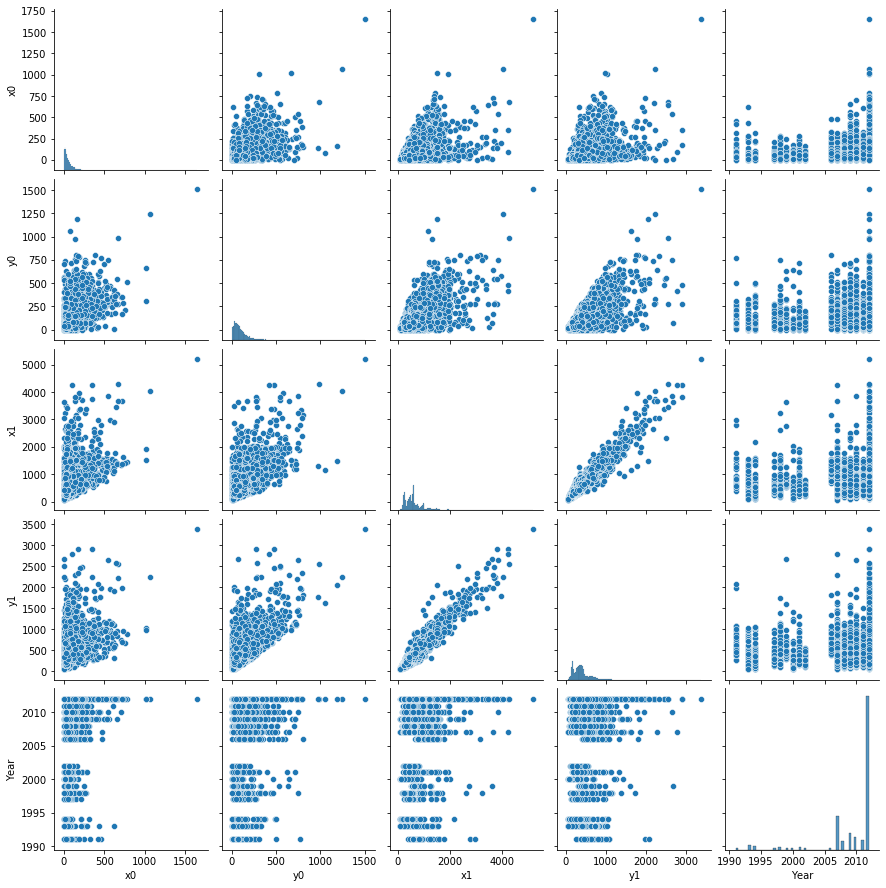

In [162]:
sns.pairplot(training_data_EDA)

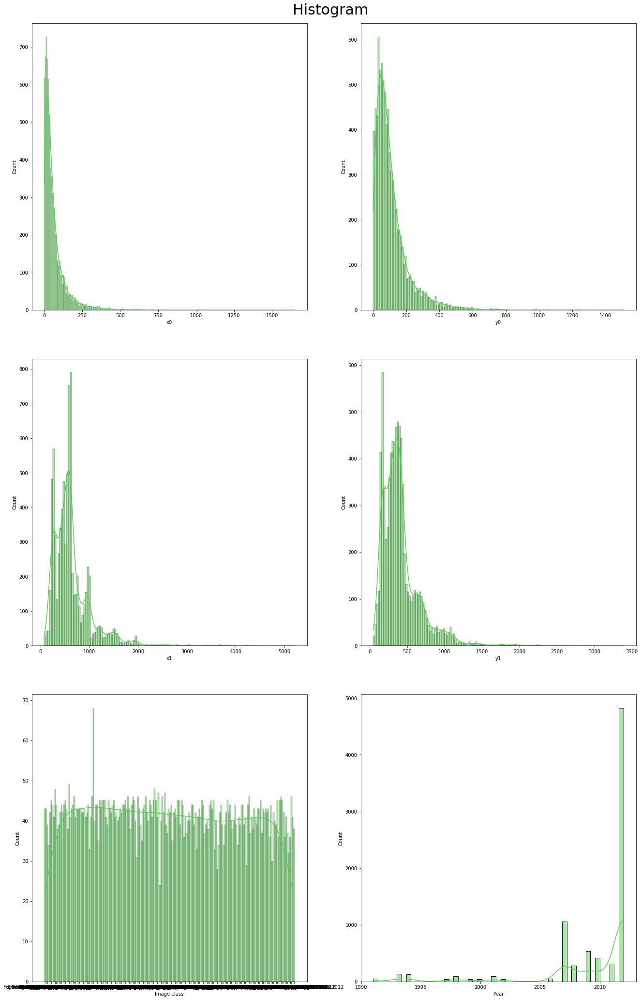

In [164]:
f,axes=plt.subplots(nrows=3, ncols=2, figsize=(20,30)) 
f.tight_layout(pad=8) 
f.suptitle('Histogram', fontsize=30)
cols=['x0', 'y0', 'x1', 'y1', 'Image class','Year']

x_axes=0
y_axes=0

for col in cols:
    sns.histplot(data=training_data_EDA, x=col, kde=True, ax=axes[x_axes,y_axes], color='#55cf51') 
    if y_axes == 1: 
        y_axes=0
        x_axes+=1
    else:
        y_axes+=1


plt.show()

Text(0.5, 0.98, 'Vehicle Distribution by Year of Construction')

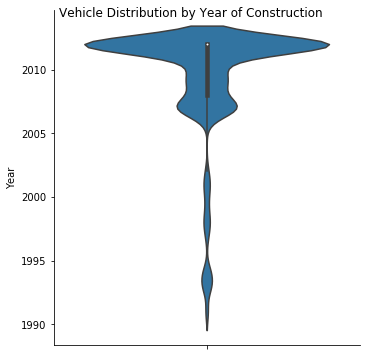

In [166]:
sns.catplot(y='Year', kind='violin', data=training_data_EDA)
plt.suptitle('Vehicle Distribution by Year of Construction')

In [167]:
year_group=training_data_EDA.groupby(by='Year').count()
year_group.head()

,Image Name,x0,y0,x1,y1,Image class
Year,,,,,,
1991,46,46,46,46,46,46
1993,139,139,139,139,139,139
1994,128,128,128,128,128,128
1997,44,44,44,44,44,44
1998,92,92,92,92,92,92


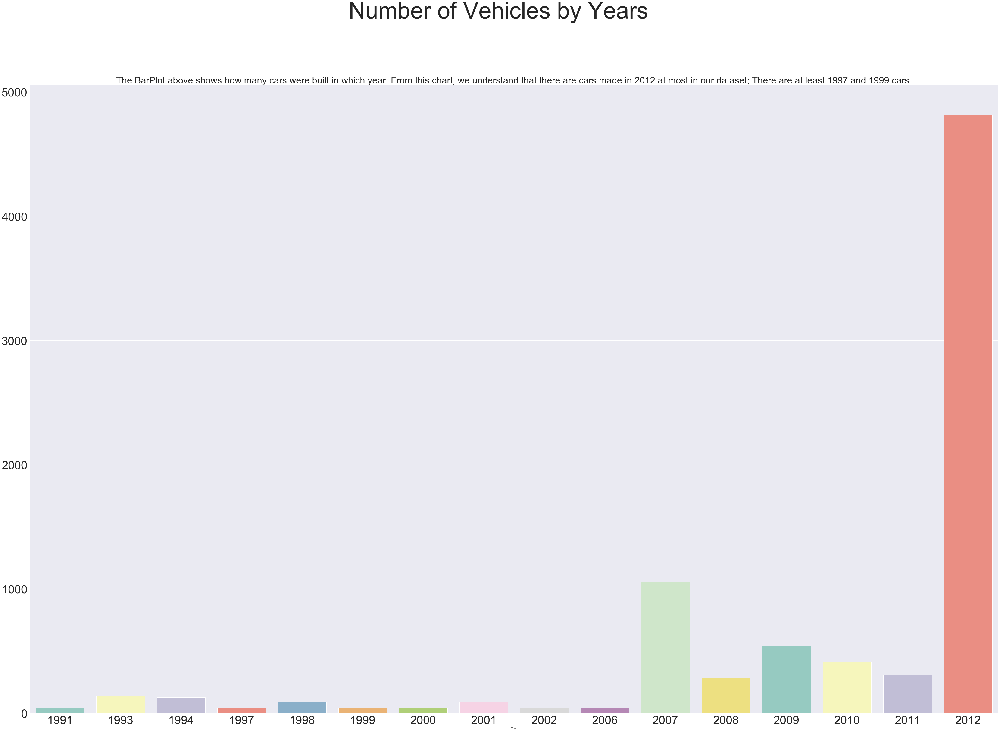

In [168]:
sns.set(rc={'figure.figsize':(75,50)})
    
plt.xticks(fontsize=50)
plt.yticks(fontsize=50)
plt.suptitle('Number of Vehicles by Years',fontsize=100)
plt.title('''The BarPlot above shows how many cars were built in which year. From this chart, we understand that there are cars made in 2012 at most in our dataset; There are at least 1997 and 1999 cars.''',fontsize=40)
bar=sns.barplot(x=year_group.index, y=year_group['Image class'].values, palette='Set3');

In [170]:
training_data_EDA.groupby(['Image class'])['Year'].mean()

Image class
AM General Hummer SUV 2000        2000
Acura Integra Type R 2001         2001
Acura RL Sedan 2012               2012
Acura TL Sedan 2012               2012
Acura TL Type-S 2008              2008
                                  ... 
Volkswagen Golf Hatchback 2012    2012
Volvo 240 Sedan 1993              1993
Volvo C30 Hatchback 2012          2012
Volvo XC90 SUV 2007               2007
smart fortwo Convertible 2012     2012
Name: Year, Length: 196, dtype: int32

In [171]:
training_data_EDA.groupby(['Year','Image class']).count() 

Image Name  x0  y0  x1  y1
Year Image class                                                         
1991 Volkswagen Golf Hatchback 1991                    46  46  46  46  46
1993 Geo Metro Convertible 1993                        45  45  45  45  45
     Mercedes-Benz 300-Class Convertible 1993          48  48  48  48  48
     Volvo 240 Sedan 1993                              46  46  46  46  46
1994 Audi 100 Sedan 1994                               41  41  41  41  41
...                                                   ...  ..  ..  ..  ..
2012 Toyota Sequoia SUV 2012                           39  39  39  39  39
     Volkswagen Beetle Hatchback 2012                  43  43  43  43  43
     Volkswagen Golf Hatchback 2012                    43  43  43  43  43
     Volvo C30 Hatchback 2012                          42  42  42  42  42
     smart fortwo Convertible 2012                     40  40  40  40  40

[196 rows x 5 columns]

<span style="font-family: Arial; font-weight:bold;font-size:2em;color:#00b3e5;"> Step 4: Display images with bounding box

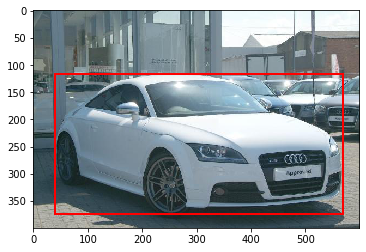

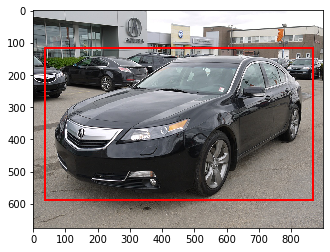

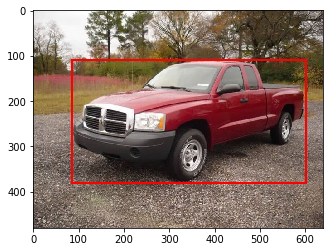

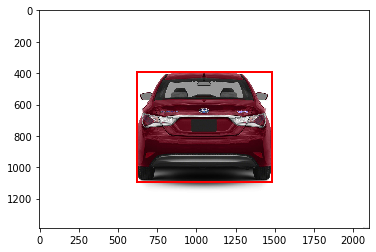

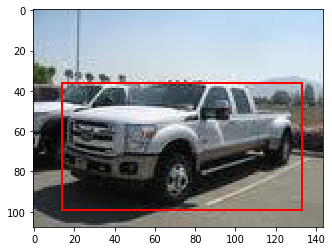

...

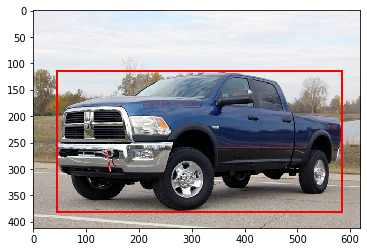

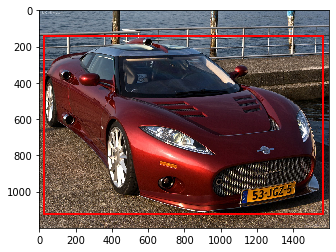

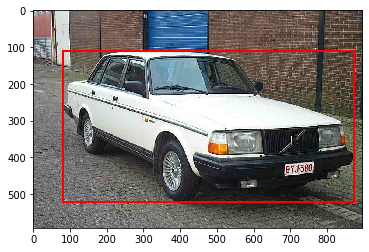

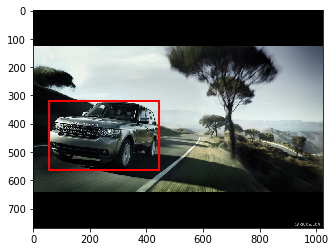

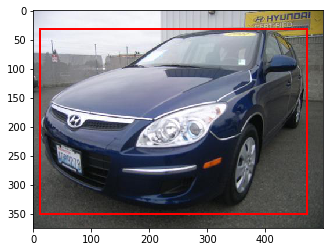

In [68]:
# Plot original images and original bounding box sizes
i = 0
for file_name in training_annotations['Image Name']:
    if i<32:
        img_original = imread(file_name)
        fig,ax = plt.subplots(1)
        ax.imshow(img_original)
        mask_data = training_annotations[training_annotations['Image Name']==file_name]
        mask = patches.Rectangle((mask_data['x0'].values[0], mask_data['y0'].values[0]), mask_data['x1'].values[0]-mask_data['x0'].values[0], mask_data['y1'].values[0]-mask_data['y0'].values[0], linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(mask)
        plt.show()
        plt.close()
        i+=1
        #print(img_original.shape[0])
        #print(img_original.shape[1])
        #print(mask_data['x0'].values[0])
        #print(mask_data['y0'].values[0])
        #print(mask_data['x1'].values[0])
        #print(mask_data['y1'].values[0])

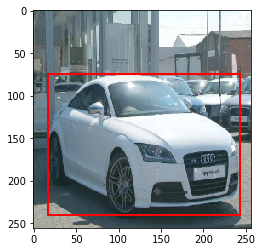

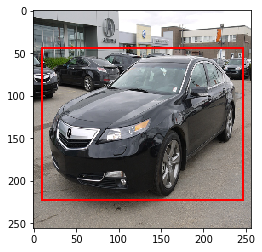

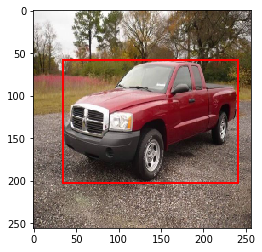

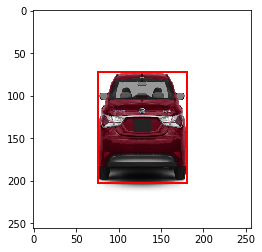

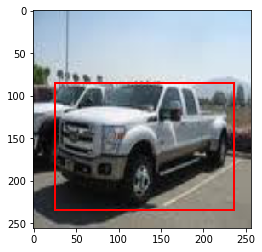

...

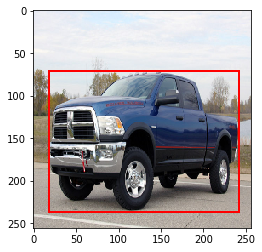

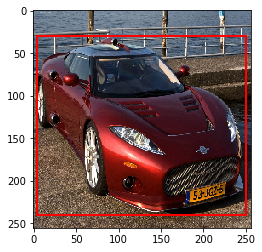

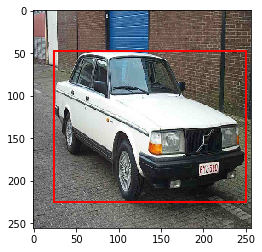

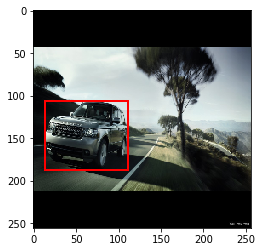

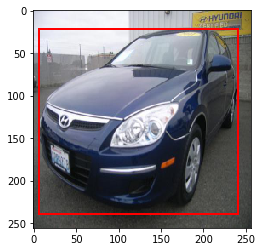

In [67]:
# Plot resized images and resized bounding box sizes
i = 0
for file_name in training_annotations['Image Name']:
    if i<32:
        img_original = imread(file_name)
        img_resize = cv2.resize(img_original,[256,256])
        fig,ax = plt.subplots(1)
        ax.imshow(img_resize)
        mask = patches.Rectangle((y_train[i,0], y_train[i,1]), y_train[i,2]-y_train[i,0], y_train[i,3]-y_train[i,1], linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(mask)
        plt.show()
        plt.close()
        i+=1

<span style="font-family: Arial; font-weight:bold;font-size:2.5em;color:#00b3e5;">  Milestone 2

<span style="font-family: Arial; font-weight:bold;font-size:2em;color:#00b3e5;"> Step-2: Design,  train  and  test  RCNN  &  its  hybrids  based  object  detection  models  to  impose  the  bounding  box  or mask over the area of interest.

Considering the timeline of the project and absence of availability of an open source API (according to the knowledge of the Authors), we use a publicly available libraries for Faster R-CNN in https://github.com/indiantechwarrior/faster_rcnn_tensorflow.

In [3]:
from __future__ import division
import random
import pprint
import sys
import time
import numpy as np
from optparse import OptionParser
import pickle
import os

from keras import backend as K
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras import Input
from tensorflow.keras import Model
from tensorflow.keras.models import load_model
from keras_frcnn import config, data_generators
#from keras_frcnn import losses_cust
import keras_frcnn.roi_helpers as roi_helpers
from keras.utils import generic_utils
import tensorflow as tf
from keras_frcnn.simple_parser import get_data
import csv

In [4]:
C = config.Config()
C.model_path = './'
C.num_rois = 50
C.rpn_stride = 16

In [5]:
from keras_frcnn import resnet as nn

In [8]:
all_imgs, classes_count, class_mapping = get_data('./Annotations/Train Annotations_temp.csv')

Parsing annotation files


In [9]:
#classes_count

In [10]:
all_imgs[0]

{'filepath': '.\\Car Images\\Train Images\\Audi TTS Coupe 2012\\00001.jpg',
 'width': 600,
 'height': 400,
 'bboxes': [{'class': 'Audi TTS Coupe 2012',
   'x1': 39,
   'x2': 569,
   'y1': 116,
   'y2': 375}],
 'imageset': 'trainval'}

In [11]:
#class_mapping

In [12]:
if 'bg' not in classes_count:
    classes_count['bg'] = 0
    class_mapping['bg'] = len(class_mapping)

In [13]:
C.class_mapping = class_mapping

In [14]:
train_imgs = [s for s in all_imgs if s['imageset'] == 'trainval']
val_imgs = [s for s in all_imgs if s['imageset'] == 'test']

In [15]:
data_gen_train = data_generators.get_anchor_gt(train_imgs, classes_count, C, nn.get_img_output_length, 'tf', mode='train')
data_gen_val = data_generators.get_anchor_gt(val_imgs, classes_count, C, nn.get_img_output_length,'tf', mode='val')

In [16]:
img_input = Input(shape=(None, None, 3))
roi_input = Input(shape=(None, 4))

In [17]:
shared_layers = nn.nn_base(img_input, trainable=False)

In [18]:
C.base_net_weights = './resnet50_weights_tf_dim_ordering_tf_kernels.h5'

In [19]:
optimizer = Adam(learning_rate=1e-4, clipnorm=0.001)
optimizer_classifier = Adam(learning_rate=1e-4, clipnorm=0.001)

In [20]:
from keras import backend as K
from tensorflow.keras.metrics import categorical_crossentropy
#from tensorflow.keras.metrics import binary_crossentropy

lambda_rpn_regr = 1.0
lambda_rpn_class = 1.0

lambda_cls_regr = 1.0
lambda_cls_class = 1.0

epsilon = 1e-4


def rpn_loss_regr(num_anchors):
    """Loss function for rpn regression
    Args:
        num_anchors: number of anchors (9 in here)
    Returns:
        Smooth L1 loss function 
                           0.5*x*x (if x_abs < 1)
                           x_abx - 0.5 (otherwise)
    """
    def rpn_loss_regr_fixed_num(y_true, y_pred):

        x = y_true[:, :, :, 4 * num_anchors:] - y_pred
        x_abs = K.abs(x)
        x_bool = K.cast(K.less_equal(x_abs, 1.0), tf.float32)

        return lambda_rpn_regr * K.sum(
            y_true[:, :, :, :4 * num_anchors] * (x_bool * (0.5 * x * x) + (1 - x_bool) * (x_abs - 0.5))) / K.sum(epsilon + y_true[:, :, :, :4 * num_anchors])

    return rpn_loss_regr_fixed_num


def rpn_loss_cls(num_anchors):
    """Loss function for rpn classification
    Args:
        num_anchors: number of anchors (9 in here)
        y_true[:, :, :, :9]: [0,1,0,0,0,0,0,1,0] means only the second and the eighth box is valid which contains pos or neg anchor => isValid
        y_true[:, :, :, 9:]: [0,1,0,0,0,0,0,0,0] means the second box is pos and eighth box is negative
    Returns:
        lambda * sum((binary_crossentropy(isValid*y_pred,y_true))) / N
    """
    def rpn_loss_cls_fixed_num(y_true, y_pred):
        return lambda_rpn_class * K.sum(y_true[:, :, :, :num_anchors] * K.binary_crossentropy(y_pred[:, :, :, :], y_true[:, :, :, num_anchors:])) / K.sum(epsilon + y_true[:, :, :, :num_anchors])

    return rpn_loss_cls_fixed_num


def class_loss_regr(num_classes):
    """Loss function for rpn regression
    Args:
        num_anchors: number of anchors (9 in here)
    Returns:
        Smooth L1 loss function 
                           0.5*x*x (if x_abs < 1)
                           x_abx - 0.5 (otherwise)
    """
    def class_loss_regr_fixed_num(y_true, y_pred):
        #print(y_pred.dtype)
        #print(y_true.dtype)
        y_true = tf.cast(y_true, tf.float32)
        #print(y_true.dtype)
        x = y_true[:, :, 4*int(num_classes):] - y_pred
        x_abs = K.abs(x)
        x_bool = K.cast(K.less_equal(x_abs, 1.0), 'float32')
        return lambda_cls_regr * K.sum(y_true[:, :, :4*int(num_classes)] * (x_bool * (0.5 * x * x) + (1 - x_bool) * (x_abs - 0.5))) / K.sum(epsilon + y_true[:, :, :4*int(num_classes)])
    return class_loss_regr_fixed_num


def class_loss_cls(y_true, y_pred):
    return lambda_cls_class * K.mean(categorical_crossentropy(y_true[0, :, :], y_pred[0, :, :]))

In [18]:
num_anchors = len(C.anchor_box_scales) * len(C.anchor_box_ratios)
rpn = nn.rpn(shared_layers, num_anchors)

classifier = nn.classifier(shared_layers, roi_input, C.num_rois, nb_classes=len(classes_count), trainable=True)

model_rpn = Model(img_input, rpn[:2])
model_classifier = Model([img_input, roi_input], classifier)

model_all = Model([img_input, roi_input], rpn[:2] + classifier)

model_rpn.load_weights(C.base_net_weights, by_name=True)
model_classifier.load_weights(C.base_net_weights, by_name=True)

In [19]:
model_rpn.compile(optimizer=optimizer, loss=[rpn_loss_cls(num_anchors), rpn_loss_regr(num_anchors)])
model_classifier.compile(optimizer=optimizer_classifier, loss=[class_loss_cls, class_loss_regr(len(classes_count)-1)], metrics={'dense_class_{}'.format(len(classes_count)): 'accuracy'})
model_all.compile(optimizer='sgd', loss='mae')

epoch_length = int(100)
num_epochs = int(250)
iter_num = 0

rpn_weight_path = None

loss_vals = np.zeros((epoch_length, 5))
rpn_accuracy_rpn_monitor = []
rpn_accuracy_for_epoch = []
start_time = time.time()

best_loss = np.Inf

class_mapping_inv = {v: k for k, v in class_mapping.items()}
print('Starting training')

vis = True

for epoch_num in range(num_epochs):
    progbar = generic_utils.Progbar(epoch_length)
    print('Epoch {}/{}'.format(epoch_num + 1, num_epochs))
    
    # first 3 epoch is warmup
    if epoch_num < 3 and rpn_weight_path is not None:
        K.set_value(model_rpn.optimizer.lr, 1e-4)
        K.set_value(model_classifier.optimizer.lr, 1e-4)
    
    while True:
        try:
            X, Y, img_data = next(data_gen_train)
            #print(len(img_data))
            if len(rpn_accuracy_rpn_monitor) == epoch_length and C.verbose:
                mean_overlapping_bboxes = float(sum(rpn_accuracy_rpn_monitor))/len(rpn_accuracy_rpn_monitor)
                rpn_accuracy_rpn_monitor = []
                print('Average number of overlapping bounding boxes from RPN = {} for {} previous iterations'.format(mean_overlapping_bboxes, epoch_length))
                if mean_overlapping_bboxes == 0:
                    print('RPN is not producing bounding boxes that overlap the ground truth boxes. Check RPN settings or keep training.')
            loss_rpn = model_rpn.train_on_batch(X, Y)

            P_rpn = model_rpn.predict_on_batch(X)
            #print(P_rpn)
            R = roi_helpers.rpn_to_roi(P_rpn[0], P_rpn[1], C, 'tf', use_regr=True, overlap_thresh=0.4, max_boxes=300)
            # note: calc_iou converts from (x1,y1,x2,y2) to (x,y,w,h) format
            X2, Y1, Y2, IouS = roi_helpers.calc_iou(R, img_data, C, class_mapping)

            if X2 is None:
                rpn_accuracy_rpn_monitor.append(0)
                rpn_accuracy_for_epoch.append(0)
                continue

            neg_samples = np.where(Y1[0, :, -1] == 1)
            pos_samples = np.where(Y1[0, :, -1] == 0)

            if len(neg_samples) > 0:
                neg_samples = neg_samples[0]
            else:
                neg_samples = []

            if len(pos_samples) > 0:
                pos_samples = pos_samples[0]
            else:
                pos_samples = []
            
            rpn_accuracy_rpn_monitor.append(len(pos_samples))
            rpn_accuracy_for_epoch.append((len(pos_samples)))

            if C.num_rois > 1:
                if len(pos_samples) < C.num_rois//2:
                                selected_pos_samples = pos_samples.tolist()
                else:
                                selected_pos_samples = np.random.choice(pos_samples, C.num_rois//2, replace=False).tolist()
                try:
                                selected_neg_samples = np.random.choice(neg_samples, C.num_rois - len(selected_pos_samples), replace=False).tolist()
                except:
                                selected_neg_samples = np.random.choice(neg_samples, C.num_rois - len(selected_pos_samples), replace=True).tolist()
                sel_samples = selected_pos_samples + selected_neg_samples
            else:
                # in the extreme case where num_rois = 1, we pick a random pos or neg sample
                selected_pos_samples = pos_samples.tolist()
                selected_neg_samples = neg_samples.tolist()
                if np.random.randint(0, 2):
                                sel_samples = random.choice(neg_samples)
                else:
                                sel_samples = random.choice(pos_samples)

            loss_class = model_classifier.train_on_batch([X, X2[:, sel_samples, :]], [Y1[:, sel_samples, :], Y2[:, sel_samples, :]])

            loss_vals[iter_num, 0] = loss_rpn[1]
            loss_vals[iter_num, 1] = loss_rpn[2]

            loss_vals[iter_num, 2] = loss_class[1]
            loss_vals[iter_num, 3] = loss_class[2]
            loss_vals[iter_num, 4] = loss_class[3]

            iter_num += 1

            progbar.update(iter_num, [('rpn_cls', np.mean(loss_vals[:iter_num, 0])), ('rpn_regr', np.mean(loss_vals[:iter_num, 1])),
                                      ('detector_cls', np.mean(loss_vals[:iter_num, 2])), ('detector_regr', np.mean(loss_vals[:iter_num, 3])),
                                     ("average number of objects", len(selected_pos_samples))])

            if iter_num == epoch_length:
                loss_rpn_cls = np.mean(loss_vals[:, 0])
                loss_rpn_regr = np.mean(loss_vals[:, 1])
                loss_class_cls = np.mean(loss_vals[:, 2])
                loss_class_regr = np.mean(loss_vals[:, 3])
                class_acc = np.mean(loss_vals[:, 4])

                mean_overlapping_bboxes = float(sum(rpn_accuracy_for_epoch)) / len(rpn_accuracy_for_epoch)
                rpn_accuracy_for_epoch = []

                if C.verbose:
                    print('Mean number of bounding boxes from RPN overlapping ground truth boxes: {}'.format(mean_overlapping_bboxes))
                    print('Classifier accuracy for bounding boxes from RPN: {}'.format(class_acc))
                    print('Loss RPN classifier: {}'.format(loss_rpn_cls))
                    print('Loss RPN regression: {}'.format(loss_rpn_regr))
                    print('Loss Detector classifier: {}'.format(loss_class_cls))
                    print('Loss Detector regression: {}'.format(loss_class_regr))
                    print('Elapsed time: {}'.format(time.time() - start_time))

                curr_loss = loss_rpn_cls + loss_rpn_regr + loss_class_cls + loss_class_regr
                iter_num = 0
                start_time = time.time()

                if curr_loss < best_loss:
                    if C.verbose:
                        print('Total loss decreased from {} to {}, saving weights'.format(best_loss,curr_loss))
                    best_loss = curr_loss
                    model_all.save_weights(C.model_path)

                break

        except Exception as e:
            print('Exception 123: {}'.format(e))
            continue

print('Training complete, exiting.')

Starting training
Epoch 1/250
100/100 [==============================] - 65s 390ms/step - rpn_cls: 2.1205 - rpn_regr: 0.0780 - detector_cls: 2.2872 - detector_regr: 0.2334 - average number of objects: 1.1300
Mean number of bounding boxes from RPN overlapping ground truth boxes: 1.13
Classifier accuracy for bounding boxes from RPN: 0.9674000060558319
Loss RPN classifier: 1.1068705455879535
Loss RPN regression: 0.07923799318261444
Loss Detector classifier: 0.9657967840821948
Loss Detector regression: 0.22028127497062086
Elapsed time: 64.81223750114441
Total loss decreased from inf to 2.3721865978233834, saving weights
Epoch 2/250
Average number of overlapping bounding boxes from RPN = 1.13 for 100 previous iterations
100/100 [==============================] - 34s 330ms/step - rpn_cls: 0.7658 - rpn_regr: 0.0703 - detector_cls: 0.2568 - detector_regr: 0.2457 - average number of objects: 1.3600
Mean number of bounding boxes from RPN overlapping ground truth boxes: 1.36
Classifier accuracy f

<span style="font-family: Arial; font-weight:bold;font-size:2em;color:#00b3e5;">  Pickling the model and its weights for future use

In [20]:
model_rpn.save('./model_rpn_resnet.h5')
model_classifier.save('./model_classifier_resnet.h5')
model_all.save('./model_all_resnet.h5')

In [21]:
model_rpn.save_weights('./model_rpn_weights_resnet.h5')
model_classifier.save_weights('./model_classifier_weights_resnet.h5')
model_all.save_weights('./model_all_weights_resnet.h5')

In [6]:
def format_img_size(img, C):
    """ formats the image size based on config """
    img_min_side = float(C.im_size)
    height = img.shape[0]
    width = img.shape[1]

    if width <= height:
        ratio = img_min_side/width
        new_height = int(img_min_side)#int(ratio * height)
        new_width = int(img_min_side)
    else:
        ratio = img_min_side/height
        new_width = int(img_min_side)#int(ratio * width)
        new_height = int(img_min_side)
    img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
    return img, ratio

def format_img_channels(img, C):
    """ formats the image channels based on config """
    img = img[:, :, (2, 1, 0)]
    img = img.astype(np.float32)
    img[:, :, 0] -= C.img_channel_mean[0]
    img[:, :, 1] -= C.img_channel_mean[1]
    img[:, :, 2] -= C.img_channel_mean[2]
    img /= C.img_scaling_factor
    img = np.transpose(img, (2, 0, 1))
    img = np.expand_dims(img, axis=0)
    return img

def format_img(img, C):
    """ formats an image for model prediction based on config """
    img, ratio = format_img_size(img, C)
    img = format_img_channels(img, C)
    return img, ratio


# Method to transform the coordinates of the bounding box to its original size
def get_real_coordinates(ratio, x1, y1, x2, y2):

    real_x1 = int(round(x1 // ratio))
    real_y1 = int(round(y1 // ratio))
    real_x2 = int(round(x2 // ratio))
    real_y2 = int(round(y2 // ratio))

    return (real_x1, real_y1, real_x2 ,real_y2)

In [21]:
num_rois = C.num_rois
class_mapping = {v: k for k, v in class_mapping.items()}
print(class_mapping)
class_to_color = {class_mapping[v]: np.random.randint(0, 255, 3) for v in class_mapping}

{0: 'Audi TTS Coupe 2012', 1: 'Acura TL Sedan 2012', 2: 'Dodge Dakota Club Cab 2007', 3: 'Hyundai Sonata Hybrid Sedan 2012', 4: 'Ford F-450 Super Duty Crew Cab 2012', 5: 'Geo Metro Convertible 1993', 6: 'Dodge Journey SUV 2012', 7: 'Dodge Charger Sedan 2012', 8: 'Mitsubishi Lancer Sedan 2012', 9: 'Chevrolet Traverse SUV 2012', 10: 'Buick Verano Sedan 2012', 11: 'Toyota Sequoia SUV 2012', 12: 'Hyundai Elantra Sedan 2007', 13: 'Dodge Caravan Minivan 1997', 14: 'Volvo C30 Hatchback 2012', 15: 'Plymouth Neon Coupe 1999', 16: 'Chevrolet Malibu Sedan 2007', 17: 'Volkswagen Beetle Hatchback 2012', 18: 'Chevrolet Corvette Ron Fellows Edition Z06 2007', 19: 'Chrysler 300 SRT-8 2010', 20: 'BMW M6 Convertible 2010', 21: 'GMC Yukon Hybrid SUV 2012', 22: 'Nissan Juke Hatchback 2012', 23: 'Volvo 240 Sedan 1993', 24: 'Suzuki SX4 Sedan 2012', 25: 'Dodge Ram Pickup 3500 Crew Cab 2010', 26: 'Spyker C8 Coupe 2009', 27: 'Land Rover Range Rover SUV 2012', 28: 'Hyundai Elantra Touring Hatchback 2012', 29: '

In [22]:
num_features_test = 1024

input_shape_img_test = (None, None, 3)
input_shape_features_test = (None, None, num_features_test)

img_input_test = Input(shape=input_shape_img_test)
roi_input_test = Input(shape=(C.num_rois, 4))
feature_map_input_test = Input(shape=input_shape_features_test)

# define the base network (resnet here, can be VGG, Inception, etc)
shared_layers_test = nn.nn_base(img_input_test)

# define the RPN, built on the base layers
num_anchors = len(C.anchor_box_scales) * len(C.anchor_box_ratios)
rpn_layers_test = nn.rpn(shared_layers_test, num_anchors)

classifier_test = nn.classifier(feature_map_input_test, roi_input_test, C.num_rois, nb_classes=len(class_mapping))

model_rpn_test = Model(img_input_test, rpn_layers_test)
model_classifier_test = Model([feature_map_input_test, roi_input_test], classifier_test)

print('Loading weights.')
model_rpn_test.load_weights('./model_rpn_weights_resnet.h5', by_name=True)
model_classifier_test.load_weights('./model_classifier_weights_resnet.h5', by_name=True)

Loading weights.


1/1 [==============================] - 0s 34ms/step


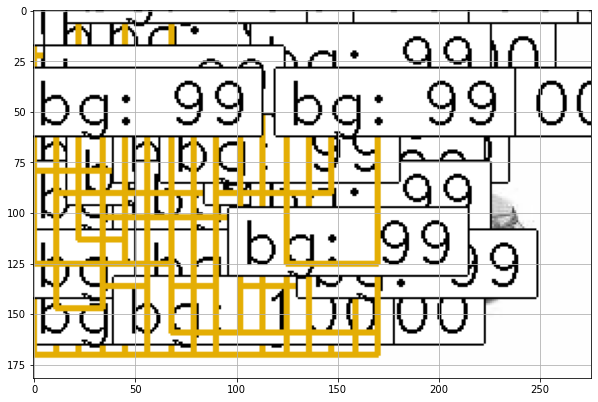

1/1 [==============================] - 0s 27ms/step


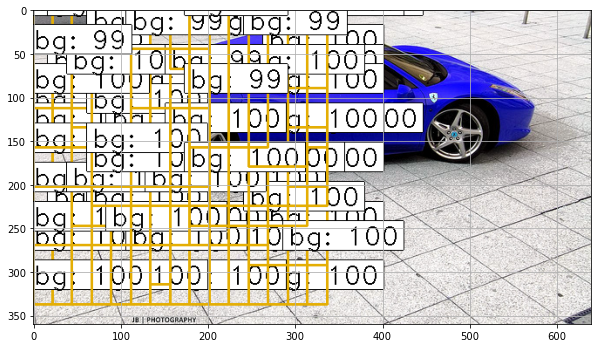

1/1 [==============================] - 0s 31ms/step


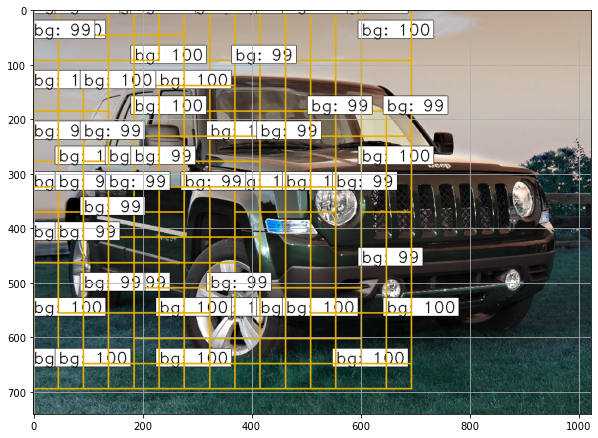

1/1 [==============================] - 0s 41ms/step


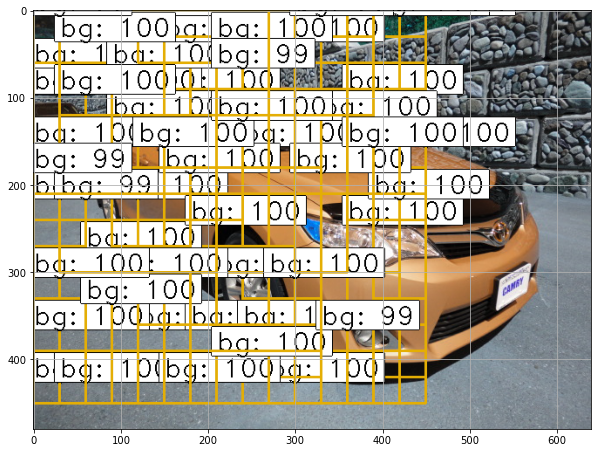

1/1 [==============================] - 0s 44ms/step


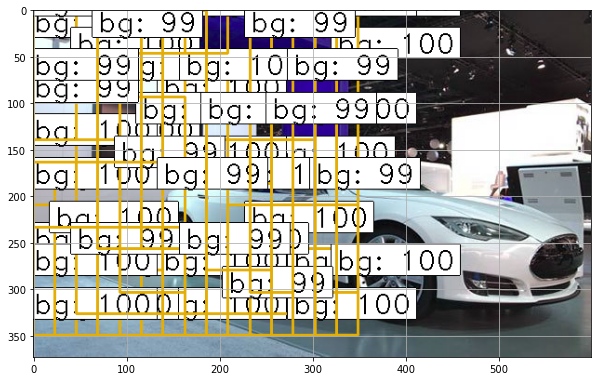

1/1 [==============================] - 0s 41ms/step


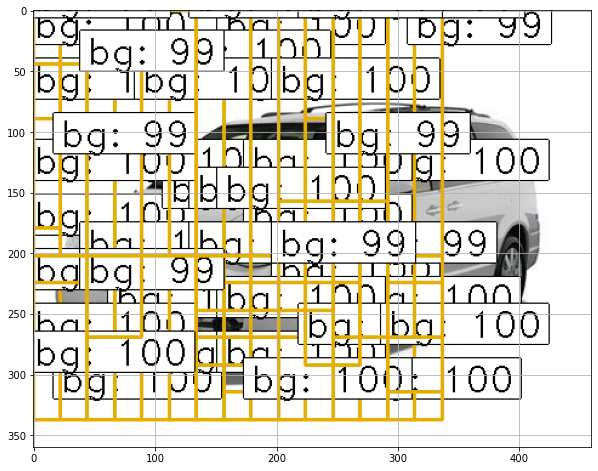

1/1 [==============================] - 0s 42ms/step


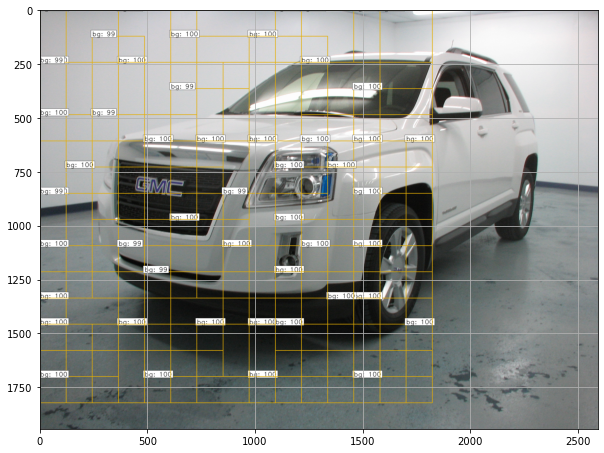

1/1 [==============================] - 0s 41ms/step


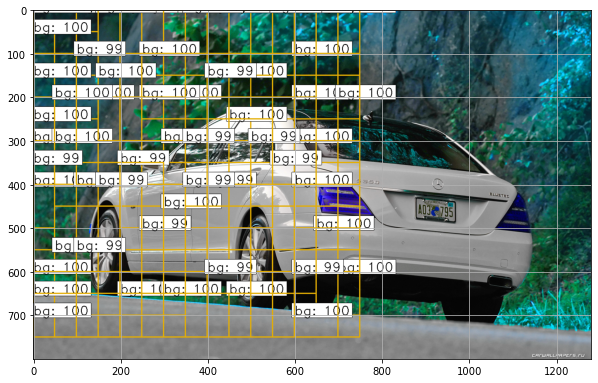

1/1 [==============================] - 0s 38ms/step


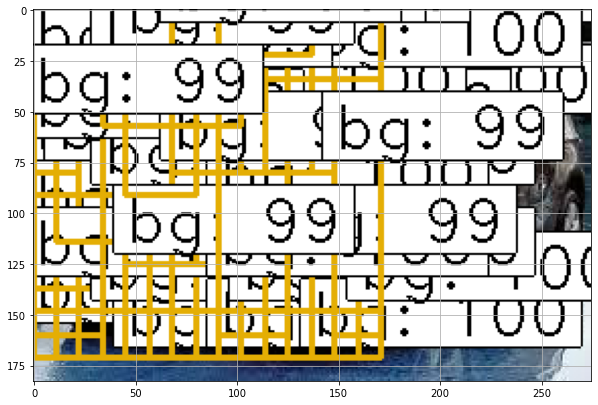

1/1 [==============================] - 0s 31ms/step


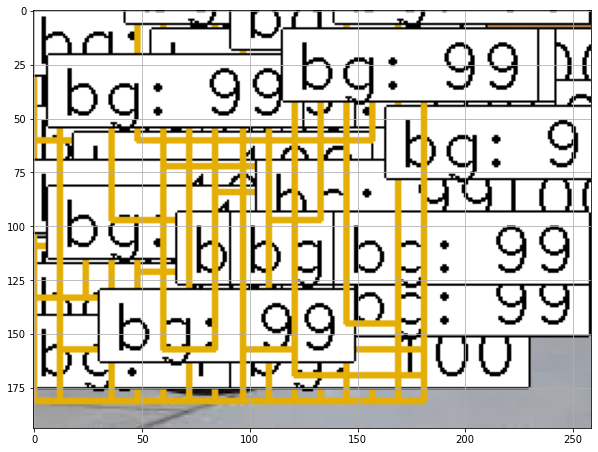

1/1 [==============================] - 0s 47ms/step


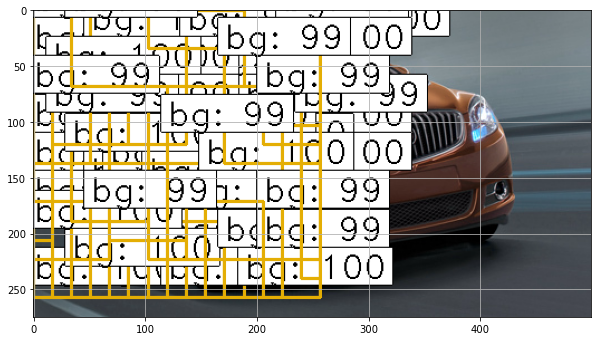

1/1 [==============================] - 0s 38ms/step


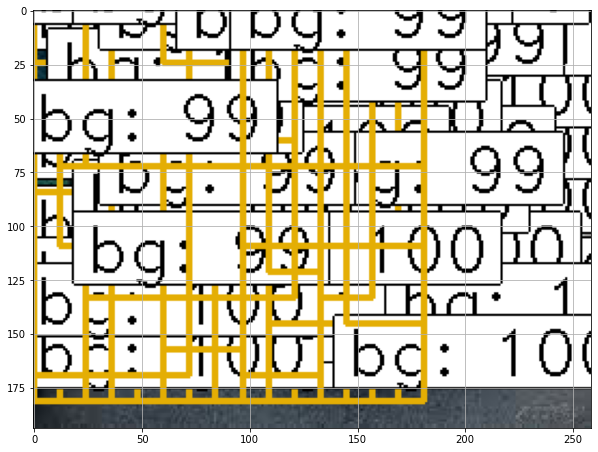

1/1 [==============================] - 0s 43ms/step


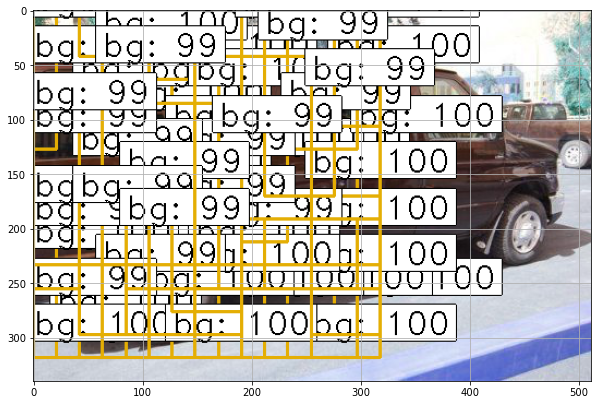

1/1 [==============================] - 0s 47ms/step


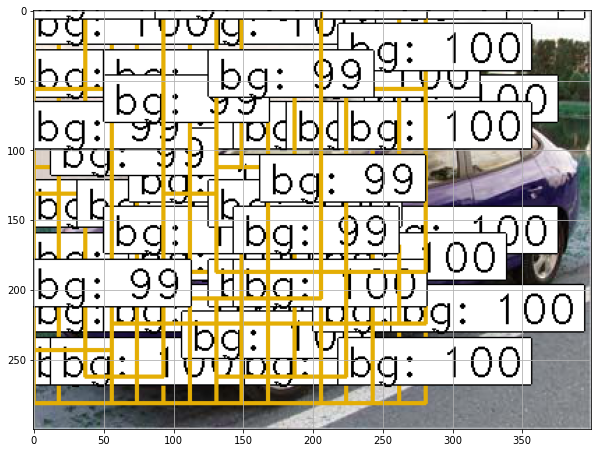

1/1 [==============================] - 0s 38ms/step


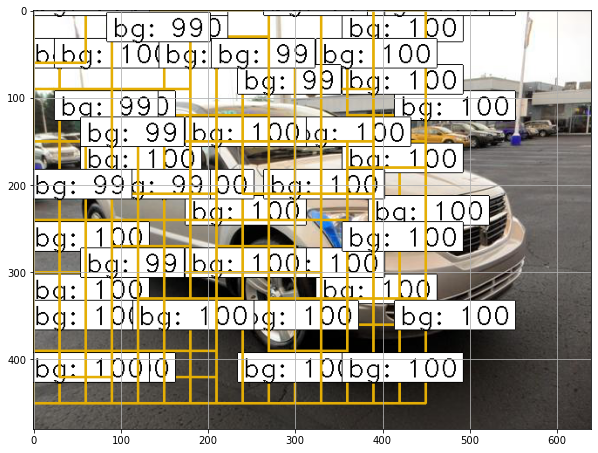

1/1 [==============================] - 0s 31ms/step


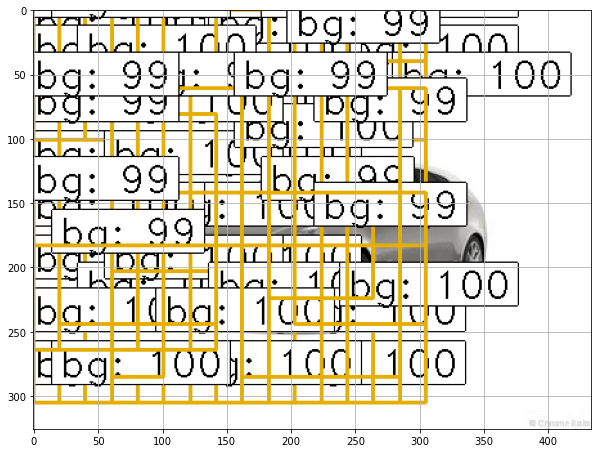

1/1 [==============================] - 0s 43ms/step


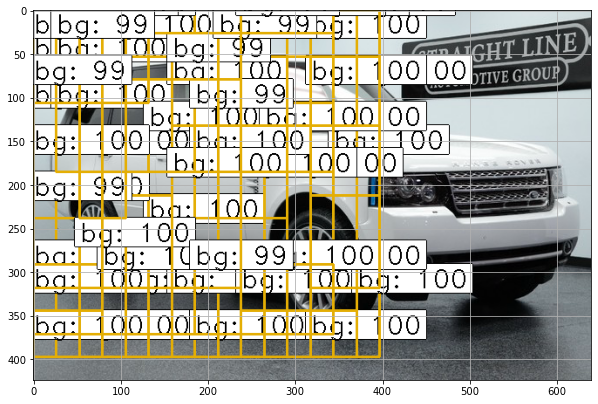

1/1 [==============================] - 0s 41ms/step


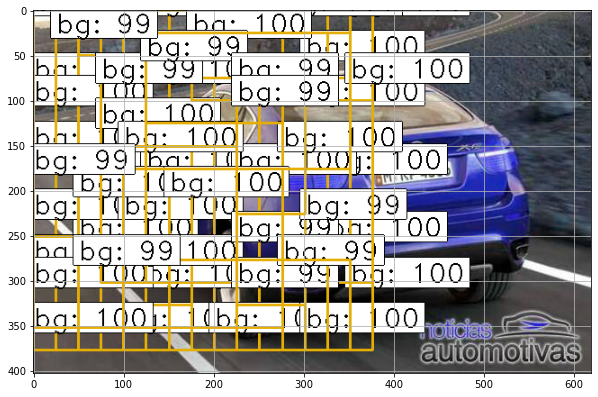

1/1 [==============================] - 0s 41ms/step


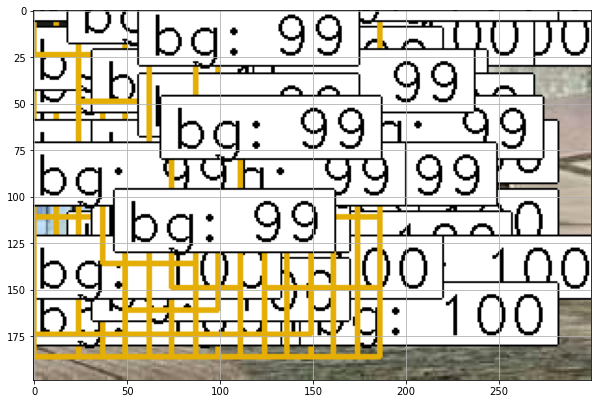

1/1 [==============================] - 0s 40ms/step


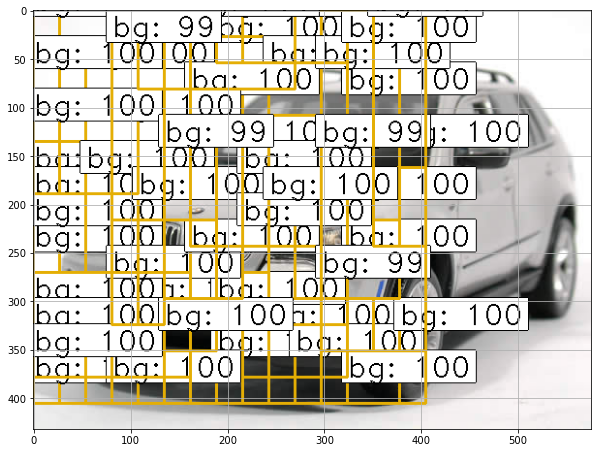

1/1 [==============================] - 0s 39ms/step


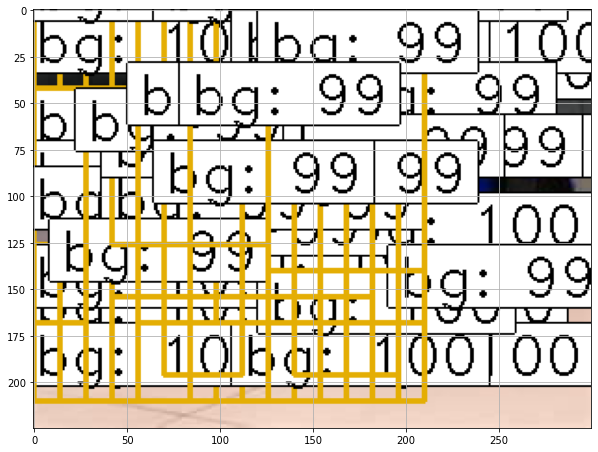

1/1 [==============================] - 0s 32ms/step


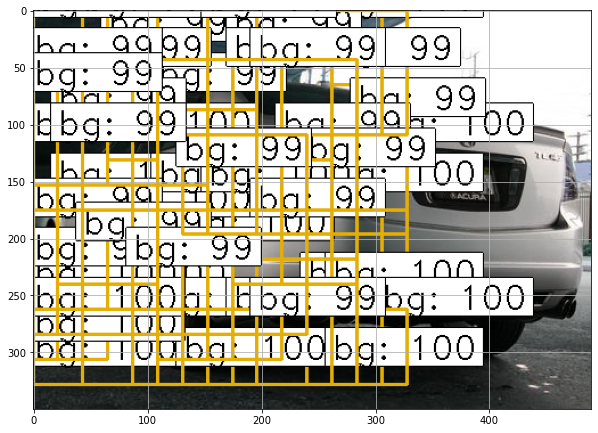

1/1 [==============================] - 0s 47ms/step


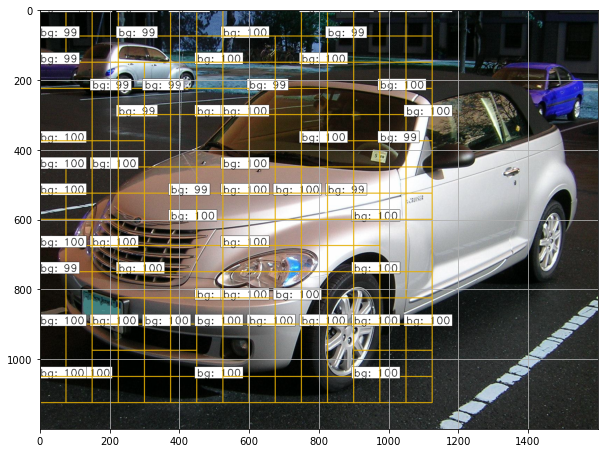

1/1 [==============================] - 0s 37ms/step


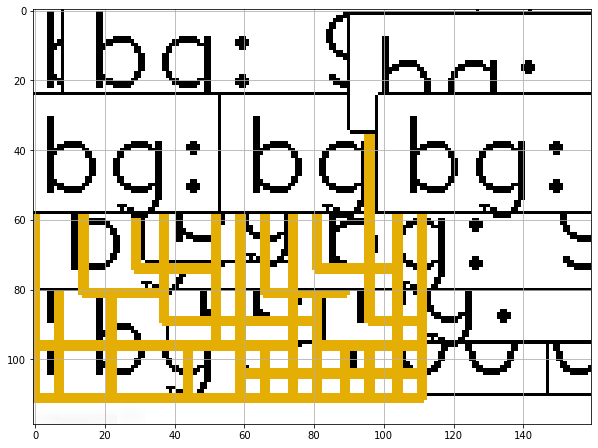

1/1 [==============================] - 0s 44ms/step


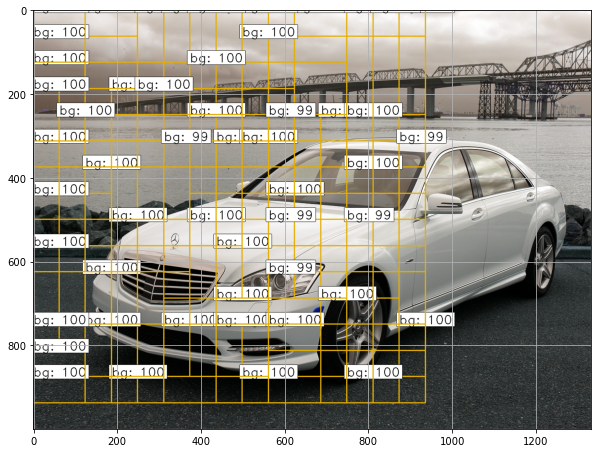

1/1 [==============================] - 0s 34ms/step


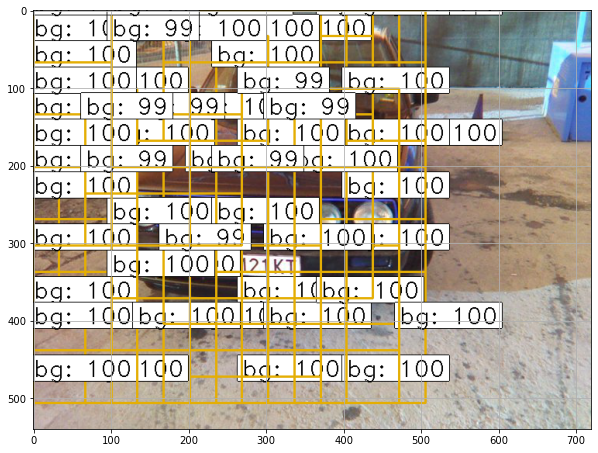

1/1 [==============================] - 0s 47ms/step


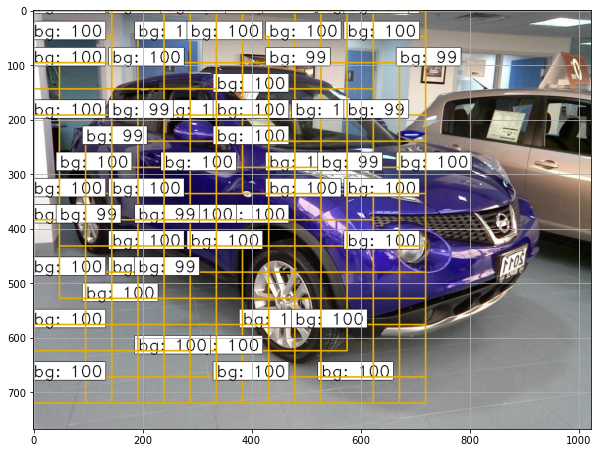

1/1 [==============================] - 0s 38ms/step


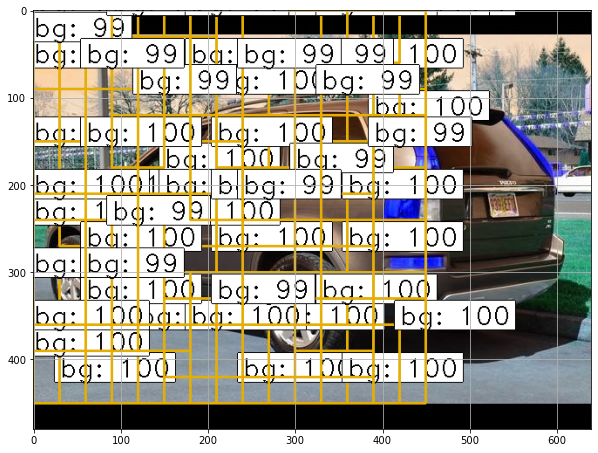

1/1 [==============================] - 0s 47ms/step


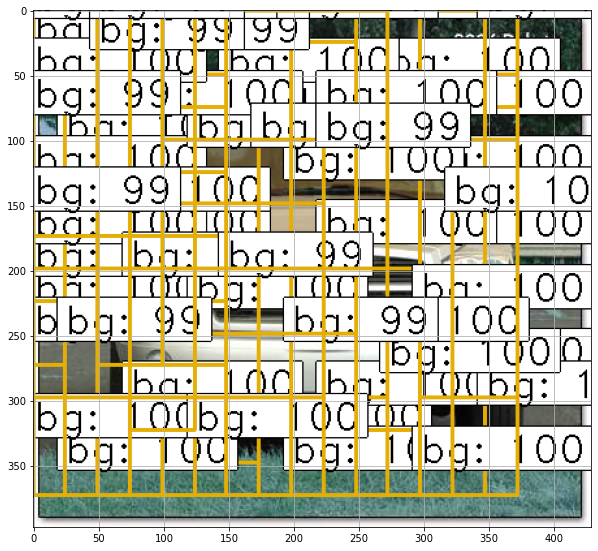

1/1 [==============================] - 0s 47ms/step


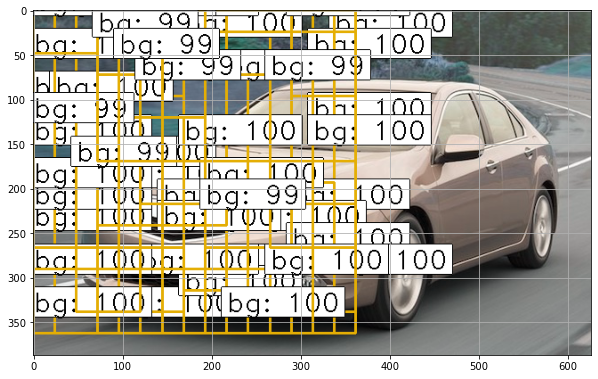

1/1 [==============================] - 0s 31ms/step


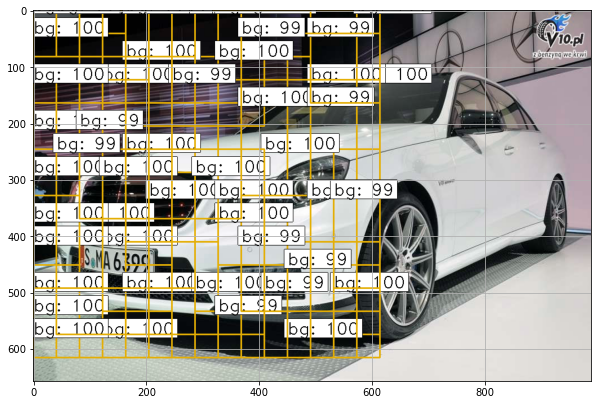

1/1 [==============================] - 0s 47ms/step


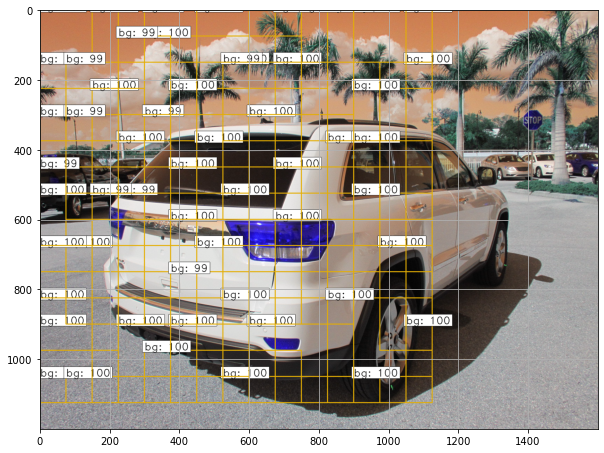

In [56]:
#bbox_threshold = 0.5
i = 0
for path_name in testing_annotations['Image Name']:
    if i<32:
        img = imread(path_name)
        #print(file_name)
        st = time.time()
        if len(img.shape) <3:
            continue
        # preprocess image
        X, ratio = format_img(img, C)
        #img_scaled = (np.transpose(X[0,:,:,:],(1,2,0)) + 127.5).astype('uint8')
        X = np.transpose(X, (0, 2, 3, 1))
        # get the feature maps and output from the RPN
        [Y1, Y2, F] = model_rpn_test.predict(X)


        R = roi_helpers.rpn_to_roi(Y1, Y2, C, 'tf', overlap_thresh=0.3)
        #print(R.shape)

        # convert from (x1,y1,x2,y2) to (x,y,w,h)
        R[:, 2] -= R[:, 0]
        R[:, 3] -= R[:, 1]

        # apply the spatial pyramid pooling to the proposed regions
        bboxes = {}
        probs = {}
        for jk in range(R.shape[0]//num_rois + 1):
            ROIs = np.expand_dims(R[num_rois*jk:num_rois*(jk+1),:],axis=0)
            if ROIs.shape[1] == 0:
                break

            if jk == R.shape[0]//num_rois:
                #pad R
                curr_shape = ROIs.shape
                target_shape = (curr_shape[0],num_rois,curr_shape[2])
                ROIs_padded = np.zeros(target_shape).astype(ROIs.dtype)
                ROIs_padded[:,:curr_shape[1],:] = ROIs
                ROIs_padded[0,curr_shape[1]:,:] = ROIs[0,0,:]
                ROIs = ROIs_padded

            [P_cls,P_regr] = model_classifier_test.predict([F, ROIs])
            #print(P_cls)

            for ii in range(P_cls.shape[1]):

                if np.max(P_cls[0,ii,:]) < 0.99:# or np.argmax(P_cls[0,ii,:]) == (P_cls.shape[2] - 1):
                    continue

                cls_name = class_mapping[np.argmax(P_cls[0,ii,:])]

                if cls_name not in bboxes:
                    bboxes[cls_name] = []
                    probs[cls_name] = []
                (x,y,w,h) = ROIs[0,ii,:]

                bboxes[cls_name].append([C.rpn_stride*x,C.rpn_stride*y,C.rpn_stride*(x+w),C.rpn_stride*(y+h)])
                probs[cls_name].append(np.max(P_cls[0,ii,:]))

        all_dets = []

        for key in bboxes:
            #print(key)
            #print(len(bboxes[key]))
            bbox = np.array(bboxes[key])

            new_boxes, new_probs = roi_helpers.non_max_suppression_fast(bbox, np.array(probs[key]), overlap_thresh = 0.3)
            for jk in range(new_boxes.shape[0]):
                (x1, y1, x2, y2) = new_boxes[jk,:]
                (real_x1, real_y1, real_x2, real_y2) = get_real_coordinates(ratio, x1, y1, x2, y2)

                cv2.rectangle(img,(real_x1, real_y1), (real_x2, real_y2), (int(class_to_color[key][0]), int(class_to_color[key][1]), int(class_to_color[key][2])),2)

                textLabel = '{}: {}'.format(key,int(100*new_probs[jk]))
                all_dets.append((key,100*new_probs[jk]))

                (retval,baseLine) = cv2.getTextSize(textLabel,cv2.FONT_HERSHEY_COMPLEX,1,1)
                textOrg = (real_x1, real_y1-0)

                cv2.rectangle(img, (textOrg[0] - 5, textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (0, 0, 0), 2)
                cv2.rectangle(img, (textOrg[0] - 5,textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (255, 255, 255), -1)
                cv2.putText(img, textLabel, textOrg, cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 0), 1)

        #print('Elapsed time = {}'.format(time.time() - st))
        #print(all_dets)
        #print(bboxes)
        #if len(bboxes) > 0:
        plt.figure(figsize=(10,10))
        plt.grid()
        plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
        plt.show()
            
        #plt.close()
        # enable if you want to show pics
        #if options.write:
         #      import os
          #     if not os.path.isdir("results"):
           #       os.mkdir("results")
            #   cv2.imwrite('./results/{}.png'.format(idx),img)
        i+=1

In [57]:
def get_map(pred, gt, f):
    T = {}
    P = {}
    fx, fy = f

    for bbox in gt:
        bbox['bbox_matched'] = False

    pred_probs = np.array([s['prob'] for s in pred])
    box_idx_sorted_by_prob = np.argsort(pred_probs)[::-1]

    for box_idx in box_idx_sorted_by_prob:
        pred_box = pred[box_idx]
        pred_class = pred_box['class']
        pred_x1 = pred_box['x1']
        pred_x2 = pred_box['x2']
        pred_y1 = pred_box['y1']
        pred_y2 = pred_box['y2']
        pred_prob = pred_box['prob']
        if pred_class not in P:
            P[pred_class] = []
            T[pred_class] = []
        P[pred_class].append(pred_prob)
        found_match = False

        for gt_box in gt:
            gt_class = gt_box['class']
            gt_x1 = gt_box['x1']/fx
            gt_x2 = gt_box['x2']/fx
            gt_y1 = gt_box['y1']/fy
            gt_y2 = gt_box['y2']/fy
            gt_seen = gt_box['bbox_matched']
            if gt_class != pred_class:
                continue
            if gt_seen:
                continue
            iou_map = iou((pred_x1, pred_y1, pred_x2, pred_y2), (gt_x1, gt_y1, gt_x2, gt_y2))
            if iou_map >= 0.5:
                found_match = True
                gt_box['bbox_matched'] = True
                break
            else:
                continue

        T[pred_class].append(int(found_match))

    for gt_box in gt:
        if not gt_box['bbox_matched']:# and not gt_box['difficult']:
            if gt_box['class'] not in P:
                P[gt_box['class']] = []
                T[gt_box['class']] = []

            T[gt_box['class']].append(1)
            P[gt_box['class']].append(0)

    #import pdb
    #pdb.set_trace()
    return T, P

In [62]:
def format_img_map(img, C):
    """Format image for mAP. Resize original image to C.im_size (300 in here)

    Args:
        img: cv2 image
        C: config

    Returns:
        img: Scaled and normalized image with expanding dimension
        fx: ratio for width scaling
        fy: ratio for height scaling
    """

    img_min_side = float(C.im_size)
    (height,width,_) = img.shape
    
    if width <= height:
        f = img_min_side/width
        new_height = int(f * height)
        new_width = int(img_min_side)
    else:
        f = img_min_side/height
        new_width = int(f * width)
        new_height = int(img_min_side)
    fx = width/float(new_width)
    fy = height/float(new_height)
    img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
    # Change image channel from BGR to RGB
    img = img[:, :, (2, 1, 0)]
    img = img.astype(np.float32)
    img[:, :, 0] -= C.img_channel_mean[0]
    img[:, :, 1] -= C.img_channel_mean[1]
    img[:, :, 2] -= C.img_channel_mean[2]
    img /= C.img_scaling_factor
    # Change img shape from (height, width, channel) to (channel, height, width)
    img = np.transpose(img, (2, 0, 1))
    # Expand one dimension at axis 0
    # img shape becames (1, channel, height, width)
    img = np.expand_dims(img, axis=0)
    return img, fx, fy

In [58]:
test_imgs, _, _ = get_data('./Annotations/Test Annotations_temp.csv')

Parsing annotation files


In [67]:
from sklearn.metrics import average_precision_score

In [68]:
i = 0
T = {}
P = {}
mAPs = []
for idx, img_data in enumerate(test_imgs):
    if i <=32:
        print('{}/{}'.format(idx,len(test_imgs)))
        st = time.time()
        filepath = img_data['filepath']

        img = cv2.imread(filepath)

        X, fx, fy = format_img_map(img, C)

        # Change X (img) shape from (1, channel, height, width) to (1, height, width, channel)
        X = np.transpose(X, (0, 2, 3, 1))

        # get the feature maps and output from the RPN
        [Y1, Y2, F] = model_rpn_test.predict(X)


        R = roi_helpers.rpn_to_roi(Y1, Y2, C, 'tf', overlap_thresh=0.7)

        # convert from (x1,y1,x2,y2) to (x,y,w,h)
        R[:, 2] -= R[:, 0]
        R[:, 3] -= R[:, 1]

        # apply the spatial pyramid pooling to the proposed regions
        bboxes = {}
        probs = {}

        for jk in range(R.shape[0] // C.num_rois + 1):
            ROIs = np.expand_dims(R[C.num_rois * jk:C.num_rois * (jk + 1), :], axis=0)
            if ROIs.shape[1] == 0:
                break

            if jk == R.shape[0] // C.num_rois:
                # pad R
                curr_shape = ROIs.shape
                target_shape = (curr_shape[0], C.num_rois, curr_shape[2])
                ROIs_padded = np.zeros(target_shape).astype(ROIs.dtype)
                ROIs_padded[:, :curr_shape[1], :] = ROIs
                ROIs_padded[0, curr_shape[1]:, :] = ROIs[0, 0, :]
                ROIs = ROIs_padded

            [P_cls, P_regr] = model_classifier_test.predict([F, ROIs])

            # Calculate all classes' bboxes coordinates on resized image (300, 400)
            # Drop 'bg' classes bboxes
            for ii in range(P_cls.shape[1]):

                # If class name is 'bg', continue
                if np.argmax(P_cls[0, ii, :]) == (P_cls.shape[2] - 1):
                    continue

                # Get class name
                cls_name = class_mapping[np.argmax(P_cls[0, ii, :])]

                if cls_name not in bboxes:
                    bboxes[cls_name] = []
                    probs[cls_name] = []

                (x, y, w, h) = ROIs[0, ii, :]

                cls_num = np.argmax(P_cls[0, ii, :])
                try:
                    (tx, ty, tw, th) = P_regr[0, ii, 4 * cls_num:4 * (cls_num + 1)]
                    tx /= C.classifier_regr_std[0]
                    ty /= C.classifier_regr_std[1]
                    tw /= C.classifier_regr_std[2]
                    th /= C.classifier_regr_std[3]
                    x, y, w, h = roi_helpers.apply_regr(x, y, w, h, tx, ty, tw, th)
                except:
                    pass
                bboxes[cls_name].append([16 * x, 16 * y, 16 * (x + w), 16 * (y + h)])
                probs[cls_name].append(np.max(P_cls[0, ii, :]))

        all_dets = []

        for key in bboxes:
            bbox = np.array(bboxes[key])

            # Apply non-max-suppression on final bboxes to get the output bounding boxe
            new_boxes, new_probs = non_max_suppression_fast(bbox, np.array(probs[key]), overlap_thresh=0.5)
            for jk in range(new_boxes.shape[0]):
                (x1, y1, x2, y2) = new_boxes[jk, :]
                det = {'x1': x1, 'x2': x2, 'y1': y1, 'y2': y2, 'class': key, 'prob': new_probs[jk]}
                all_dets.append(det)


        print('Elapsed time = {}'.format(time.time() - st))
        t, p = get_map(all_dets, img_data['bboxes'], (fx, fy))
        for key in t.keys():
            if key not in T:
                T[key] = []
                P[key] = []
            T[key].extend(t[key])
            P[key].extend(p[key])
        all_aps = []
        for key in T.keys():
            ap = average_precision_score(T[key], P[key])
            print('{} AP: {}'.format(key, ap))
            all_aps.append(ap)
        print('mAP = {}'.format(np.mean(np.array(all_aps))))
        mAPs.append(np.mean(np.array(all_aps)))
        #print(T)
        #print(P)

    print()
    print('mean average precision:', np.mean(np.array(mAPs)))
    i+=1

0/8041
1/1 [==============================] - 0s 31ms/step
Elapsed time = 0.5705323219299316
Suzuki Aerio Sedan 2007 AP: 1.0
mAP = 1.0

mean average precision: 1.0
1/8041
1/1 [==============================] - 0s 31ms/step
Elapsed time = 1.0210928916931152
Suzuki Aerio Sedan 2007 AP: 1.0
Ferrari 458 Italia Convertible 2012 AP: 1.0
mAP = 1.0

mean average precision: 1.0
2/8041
1/1 [==============================] - 0s 31ms/step
Elapsed time = 0.9819269180297852
Suzuki Aerio Sedan 2007 AP: 1.0
Ferrari 458 Italia Convertible 2012 AP: 1.0
Jeep Patriot SUV 2012 AP: 1.0
mAP = 1.0

mean average precision: 1.0
3/8041
1/1 [==============================] - 0s 31ms/step
Elapsed time = 0.8101511001586914
Suzuki Aerio Sedan 2007 AP: 1.0
Ferrari 458 Italia Convertible 2012 AP: 1.0
Jeep Patriot SUV 2012 AP: 1.0
Toyota Camry Sedan 2012 AP: 1.0
mAP = 1.0

mean average precision: 1.0
4/8041
1/1 [==============================] - 0s 35ms/step
Elapsed time = 0.9704420566558838
Suzuki Aerio Sedan 2007 AP: